In [1]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import plotly.graph_objects as go
import os

- intesidad: no interesa
- t: marca de tiempo (no interesa)
- reflectividad (no interesa)
- ring: plano
- ambient: luz ambiental (no interasa)
- range: rango maximo con esa potencia

In [2]:
df = pd.read_csv('./data/carretera.csv')
df.tail(10)

,x,y,z,intensity,t,reflectivity,ring,ambient,range
131062,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131063,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131064,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131065,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131066,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131067,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131068,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131069,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131070,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131071,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0


In [3]:
fig = px.scatter(df, x='x', y='z', color='ring')
fig.show()

In [4]:
print(f"Number of rows before removing: {len(df)}")
def filter_points(df_input):
    widht = 4
    lenght = 25

    df_filtered = df_input[~((df_input['x'] == 0) & (df_input['y'] == 0) & (df_input['z'] == 0))]
    df_filtered = df_filtered[(df_filtered['z'] > -widht) & (df_filtered['z'] < widht) & (df_filtered['x'] > -lenght) & (df_filtered['x'] < lenght)]
    df_filtered = df_filtered[df_filtered['y'] > 2]
    return df_filtered

df_cleaned = filter_points(df)
print(f"Number of rows after removing: {len(df_cleaned)}")
fig = px.scatter(df_cleaned, x='x', y='z', color='y')
fig.show()

Number of rows before removing: 131072
Number of rows after removing: 32422


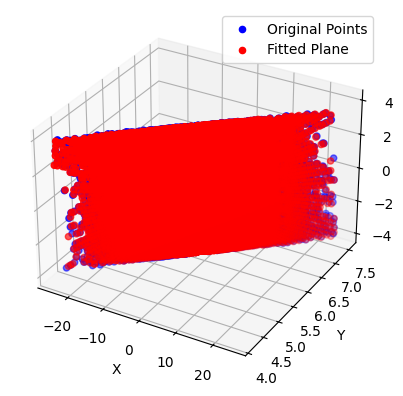

In [5]:
# Extracting the relevant columns
X = df_cleaned[['x', 'z']]
y = df_cleaned['y']

# Creating a polynomial feature transformer and RANSAC regressor
ransac = make_pipeline(PolynomialFeatures(degree=1), RANSACRegressor())

# Fitting the model
ransac.fit(X, y)

# Predicting the plane
y_pred = ransac.predict(X)

# Plotting the original points and the fitted plane
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cleaned['x'], df_cleaned['y'], df_cleaned['z'], color='blue', label='Original Points')
ax.scatter(df_cleaned['x'], y_pred, df_cleaned['z'], color='red', label='Fitted Plane')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.show()

In [6]:
# Definir el directorio donde se encuentran los archivos CSV
directory = './data/pointclouds/'

# Lista para almacenar los DataFrames
dataframes = []

# Iterar sobre los archivos en el directorio
for filename in sorted(os.listdir(directory)):
    if filename.endswith('.csv'):  # Verificar si el archivo es un CSV
        file_path = os.path.join(directory, filename)  # Crear la ruta completa del archivo
        df = pd.read_csv(file_path)  # Cargar el CSV en un DataFrame
        dataframes.append(df)  # Agregar el DataFrame a la lista

In [7]:
len(dataframes)

369

In [8]:
i = 0
for frame in dataframes:
    i = i+0
    X = frame[['x', 'y', 'z']]

    dbscan = DBSCAN(eps=2, min_samples=5)

    y_dbscan = dbscan.fit_predict(X)

    df_clustered = X.copy()
    df_clustered['cluster'] = y_dbscan

    print(np.unique(y_dbscan))

    fig = px.scatter(df_clustered, x='x', y='z', color='cluster')

    df_result = pd.DataFrame()
    df_result['x'] = df_clustered['z']
    df_result['y'] = -df_clustered['x']
    df_result['z'] = -df_clustered['y']
    df_result['cluster'] = df_clustered['cluster']

    # Calculate bounding boxes for each cluster
    bounding_boxes = {}

    for cluster in np.unique(y_dbscan)[1:]:
        cluster_points = df_result[df_result['cluster'] == cluster]
        min_x, max_x = cluster_points['x'].min(), cluster_points['x'].max()
        min_y, max_y = cluster_points['y'].min(), cluster_points['y'].max()
        min_z, max_z = cluster_points['z'].min(), cluster_points['z'].max()
        bounding_boxes[cluster] = {
            'min_x': min_x, 'max_x': max_x,
            'min_y': min_y, 'max_y': max_y,
            'min_z': min_z, 'max_z': max_z
        }

    fig = go.Figure()

    # Add original data points
    fig.add_trace(go.Scatter3d(
        x=df_result['x'],
        y=df_result['y'],
        z=df_result['z'],
        mode='markers',
        marker=dict(
            size=1,
            color=df_result['cluster'],
            colorscale='Viridis',
            opacity=0.8
        )
    ))

    for cluster, bbox in bounding_boxes.items():
        fig.add_trace(go.Scatter3d(
            x=[bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x']],
            y=[bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y']],
            z=[bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z']],
            mode='lines',
            line=dict(color='red', width=2),
            name=f'Bounding Box Cluster {cluster}'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='data'
        ),
        title='3D Scatter Plot with Bounding Boxes'
    )

    fig.write_image(f"./frames/frame_{i}.png")

[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3  4]
[-1  0  1  2  3]
[0 1 2 3]
[-1  0  1  2  3]
[-1  0  1  2  3]
[-1  0  1  2  3  4]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2  3]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]
[-1  0  1  2]


KeyboardInterrupt: 

In [204]:
df_car = pd.read_csv('./data/pointclouds/pointcloud_1727346186_586942416.csv')
display(df_car)
#df_car_filtered = filter_points(df_car)

fig = px.scatter(df_car, x='x', y='z')
fig.show()

,x,y,z
0,-30.929907,1.320922,2.895211
1,-30.967932,1.318717,2.895499
2,-31.004168,1.326541,2.905703
3,-31.041235,1.329492,2.911259
4,-31.077972,1.333956,2.918402
...,...,...,...
13113,-31.733086,3.374516,0.327516
13114,-31.782326,3.373967,0.323603
13115,-31.833403,3.370884,0.312642
13116,-31.887350,3.363949,0.290997


In [205]:
df_result = pd.DataFrame()
df_result['x'] = df_car['z']
df_result['y'] = -df_car['x']
df_result['z'] = -df_car['y']


fig = go.Figure(data=[go.Scatter3d(
    x=df_result['x'],
    y=df_result['y'],
    z=df_result['z'],
    mode='markers',
    marker=dict(
        size=1,

        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title='3D Scatter Plot of Clustered Data'
)

fig.show()

In [206]:
# Extracting the relevant columns
X = df_car[['x', 'y', 'z']]

In [207]:
dbscan = DBSCAN(eps=2, min_samples=5)

y_dbscan = dbscan.fit_predict(X)

df_clustered = X.copy()
df_clustered['cluster'] = y_dbscan

print(np.unique(y_dbscan))

fig = px.scatter(df_clustered, x='x', y='z', color='cluster')
fig.show()

[-1  0  1  2  3  4]


In [208]:
df_result = pd.DataFrame()
df_result['x'] = df_clustered['z']
df_result['y'] = -df_clustered['x']
df_result['z'] = -df_clustered['y']
df_result['cluster'] = df_clustered['cluster']

fig = go.Figure(data=[go.Scatter3d(
    x=df_result['x'],
    y=df_result['y'],
    z=df_result['z'],
    mode='markers',
    marker=dict(
        size=1,
        color=df_clustered['cluster'],
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title='3D Scatter Plot of Clustered Data'
)

fig.show()

In [209]:
# Calculate bounding boxes for each cluster
bounding_boxes = {}

for cluster in np.unique(y_dbscan)[1:]:
    cluster_points = df_result[df_result['cluster'] == cluster]
    min_x, max_x = cluster_points['x'].min(), cluster_points['x'].max()
    min_y, max_y = cluster_points['y'].min(), cluster_points['y'].max()
    min_z, max_z = cluster_points['z'].min(), cluster_points['z'].max()
    bounding_boxes[cluster] = {
        'min_x': min_x, 'max_x': max_x,
        'min_y': min_y, 'max_y': max_y,
        'min_z': min_z, 'max_z': max_z
    }

fig = go.Figure()

# Add original data points
fig.add_trace(go.Scatter3d(
    x=df_result['x'],
    y=df_result['y'],
    z=df_result['z'],
    mode='markers',
    marker=dict(
        size=1,
        color=df_result['cluster'],
        colorscale='Viridis',
        opacity=0.8
    )
))

for cluster, bbox in bounding_boxes.items():
    fig.add_trace(go.Scatter3d(
        x=[bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x']],
        y=[bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y']],
        z=[bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z']],
        mode='lines',
        line=dict(color='red', width=2),
        name=f'Bounding Box Cluster {cluster}'
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title='3D Scatter Plot with Bounding Boxes'
)

fig.show()
fig.write_image(f"frame_{i}.png")